
# **William Fussell**
### Stats and Public Health Pt. 1


### Project Description: 

In this deliverable, we are working with mosquito tracking data from the city of Chicago to perform data cleaning and exploratory data analysis (EDA). The dataset covers the years 2008 to 2019 and includes information about trap locations, mosquito populations, West Nile Virus (WNV) prevalence, and other related variables.

Our primary objective is to gain insights into mosquito populations, their species distribution, and the prevalence of WNV. By analyzing the data, we aim to identify patterns, trends, and potential relationships between different variables. This information can provide valuable insights for public health officials in understanding the dynamics of mosquito-borne diseases and implementing effective control and prevention strategies.

Throughout the deliverable, we perform basic data wrangling tasks such as handling missing values, removing redundant information, and converting data types to facilitate analysis. We then conduct exploratory data analysis using various visualizations to explore the relationships between mosquito populations, WNV prevalence, trap types, and other factors of interest.

By examining the data and visualizing key variables, we aim to uncover insights such as seasonal variations in mosquito abundance, the impact of trap types on mosquito populations, and the relationship between mosquito species and WNV prevalence. These findings can assist in understanding the factors contributing to the spread of WNV and help guide public health interventions and mosquito control efforts.

Overall, this deliverable serves as a foundational step in analyzing the mosquito tracking data and provides important insights into mosquito populations and WNV prevalence in the city of Chicago. The outcomes of this analysis can contribute to the development of targeted strategies for mosquito control and public health planning to mitigate the risks associated with mosquito-borne diseases.

In [139]:
# Import python libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as mplt
import seaborn as sns
import plotly as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.subplots as sp
import re
import geopy 
import dtale
pd.set_option("display.max_rows", None)

In [140]:
# Import Data from Mosquito CSV File
df = pd.read_csv('/Users/williamfussell/Documents/Brain Station Master/Brain Station VSC/CSV/mosquito_data.csv')
# Rename columns that have a space inbetween words to have a underscore for easier querying and dot syntax usage.
df = df.rename(columns = lambda x: re.sub(r'\s', '_', x) if len(x.split()) == 2 else x)




RENAME DATAFRAME COLUMNS

1. **df.rename(columns=...)**: This method is used in the Pandas DataFrame to rename the columns of a DataFrame. It takes a **columns** parameter, which specifies the mapping of old column names to new column names.

2. **lambda x: re.sub(r'\s', '', x) if len(x.split()) == 2 else x**:
- **lambda x**: Here we define an inline lambda function with a single argument **x**. The **x** represents the current column name being processed.

- **re.sub(r'\s', '_', x)**: This is a regular expression (regex) substitution operation using the **re.sub()** function from the **re** module. It replaces any whitespace character (**\s**) with an underscore (**_**) in the column name **x**.

- **if len(x.split()) == 2 else x**: This is a conditional expression that checks if the column name **x** has exactly two words by splitting the column name using **x.split()** and checking the length of the resulting list using **len()**. If the length is 2 (indicating two words), the regex substitution is applied; otherwise, the original column name is used without modification.

3. **df =**: This assigns the renamed DataFrame back to the variable **df**, updating the column names of the DataFrame.

## Part 1. Basic Data Wrangling <a class="anchor" id="part-1"></a>



Question 1. What is the shape of the DataFrame?

In [141]:
# To determine the shape of a DataFrame you use a 'Dot Operator' or 'Dot Notation'.
# Dot Operators' than can be used for attribute access or method invocations on objects in python.
# .shape is one of many 'Dot Operators' used for DataFrame objects, this one returns a Tuple 
# representing the number of rows and columns in the DataFrame (Rows, Columns).

print(df.shape)

(18495, 13)


Our Output Tuple above is showing that we have 18,495 Rows and 13 Columns.

In [142]:
# We can use the 'Dot Operator' .head to display the 'Head', or the top 5 rows, of the DataFrame.
# This allows the user to quickly inspect the data and get a preview of its structure.
df.head()

,Year,Week,Address_Block,Block,Trap,Trap_type,Date,Mosquito_number,Mosquito_ID,WNV_Present,Species,Lat,Lon
0,2019,39,100XX W OHARE AIRPORT,100,T910,GRAVID,2019-09-26 00:09:00,2,Res,negative,CULEX RESTUANS,NaN,NaN
1,2019,39,52XX S KOLMAR AVE,52,T114,GRAVID,2019-09-26 00:09:00,1,Res,negative,CULEX RESTUANS,41.798211,-87.736925
2,2019,39,58XX N WESTERN AVE,58,T028,GRAVID,2019-09-26 00:09:00,2,Res,negative,CULEX RESTUANS,41.987245,-87.689417
3,2019,39,39XX N SPRINGFIELD AVE,39,T228,GRAVID,2019-09-26 00:09:00,1,Res,negative,CULEX RESTUANS,41.953664,-87.724987
4,2019,39,131XX S BRANDON AVE,131,T209,GRAVID,2019-09-26 00:09:00,9,Res,negative,CULEX RESTUANS,41.657069,-87.546049


Question 2. Convert the 'Date column to have a datetime format.

In [143]:
# Here we use the pandas 'Dot Function' .to_datetime() to convert a column to a datetime format.
df['Date'] = pd.to_datetime(df['Date'])

Question 3. Pick two numeric and two catgorical columns. What Data are they storing? How are they distributed?

In [144]:
# Here we can determine the datatypes of the DataFrame by using the .dtypes 'Dot Operator'.
# You can specify which Columns you want to check y encapsulating them in a Double Brakcket [['Year','Week']]
# or you can see all datatypes by simply performing : df.dtypes
df[['Year','Week','WNV_Present','Species']].dtypes

Year            int64
Week            int64
WNV_Present    object
Species        object
dtype: object

Above, from our four columns selcted we see that we have two continuous variables and two categorical variables. Lets get a look at the entire DataFrame below:

In [145]:
# Display a concise summary of the DataFrame
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18495 entries, 0 to 18494
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   Year             18495 non-null  int64         
 1   Week             18495 non-null  int64         
 2   Address_Block    18495 non-null  object        
 3   Block            18495 non-null  int64         
 4   Trap             18495 non-null  object        
 5   Trap_type        18495 non-null  object        
 6   Date             18495 non-null  datetime64[ns]
 7   Mosquito_number  18495 non-null  int64         
 8   Mosquito_ID      18495 non-null  object        
 9   WNV_Present      18495 non-null  object        
 10  Species          18495 non-null  object        
 11  Lat              15571 non-null  float64       
 12  Lon              15571 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(4), object(6)
memory usage: 1.8+ MB


In [146]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18495 entries, 0 to 18494
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   Year             18495 non-null  int64         
 1   Week             18495 non-null  int64         
 2   Address_Block    18495 non-null  object        
 3   Block            18495 non-null  int64         
 4   Trap             18495 non-null  object        
 5   Trap_type        18495 non-null  object        
 6   Date             18495 non-null  datetime64[ns]
 7   Mosquito_number  18495 non-null  int64         
 8   Mosquito_ID      18495 non-null  object        
 9   WNV_Present      18495 non-null  object        
 10  Species          18495 non-null  object        
 11  Lat              15571 non-null  float64       
 12  Lon              15571 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(4), object(6)
memory usage: 1.8+ MB


Now that we have our DataFrame lined up lets do some more exploration on the four variables we selected before.

In [147]:
# Create a subplot with 2 rows and 2 columns, and set the subplot titles
fig = sp.make_subplots(rows=2, cols=2, subplot_titles=('Year', 'Week', 'WNV_Present', 'Species'))

# Iterate over the fields and create histograms in subplots
for i, field in enumerate(['Year', 'Week', 'WNV_Present', 'Species']):
    row = (i // 2) + 1  # Calculate the row position
    col = (i % 2) + 1   # Calculate the column position

    # Create a histogram trace for the current field
    hist_trace = go.Histogram(x=df[field], nbinsx=50, opacity=0.5)

    # Add the histogram trace to the subplot
    fig.add_trace(hist_trace, row=row, col=col)

    # Update the x-axis title for the subplot
    fig.update_xaxes(title_text=field, row=row, col=col)

    # Update the y-axis title for the subplot and reduce the distance between the title and labels
    fig.update_yaxes(title_text='Frequency', row=row, col=col, title_standoff=0)

# Update the layout of the subplot with the overall title, size, and dimensions
fig.update_layout(title_text='EDA 1', title_x=0.5, height=600, width=800)

# Display the subplot
fig.show()


In our brief analysis of the columns **Year**, **Week**, **WNV Present**, and **Species** we can see the following:

- **Year**: We can see that in 2007, the frequency of tests were at its highest.

- **Week**: We can see a seasonal trend occurring with the hotter months of the summer having the peak amount of tests done.

- **WNV Present**: We see that far more mosquitoes are negative than positive.

- **Species**: We see that the Species, Culex Restuans, takes the top as the species who appears the most in this area.

Question 4. Are there any columns that contain duplicate information? If so, remove the redundant columns.

In [148]:

df.T.duplicated()

Year               False
Week               False
Address_Block      False
Block              False
Trap               False
Trap_type          False
Date               False
Mosquito_number    False
Mosquito_ID        False
WNV_Present        False
Species            False
Lat                False
Lon                False
dtype: bool

Even though we do not have any obvious redundant columns, we can make some assumptions based on viewing the DataFrame. First, Lets break down the Date Column into more useable columns for or model later. Now that it is a datetime dtype we it will be easier to create multiple columns from it. We already have Year and Week, let create Month, Day, and Hour, Minute and Second:

In [149]:
# Extracting components from the 'Date' column and creating new columns for Month, Day, Hour, Minute, and Second
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day
df['Hour'] = df['Date'].dt.hour
df['Second'] = df['Date'].dt.second


Then we will drop the column Date as we have created indiviudal columns based on the Datetime Column. The datetime column is good but it is too granular for modeling. Next lets turn our attention to the similarities to the Mosquito Id and Mosquito Species Columns. We see below that they both have 4 unique values.

In [150]:
# Counting the number of unique values in the 'Mosquito_ID' column
df['Mosquito_ID'].nunique()


4

In [151]:
# Counting the number of unique values in the 'Species' column
df['Species'].nunique()

4

Below we will see if the column 'Mosquito_ID holds any different values than Species.

In [152]:
# Group by 'Mosquito_ID' and 'Species' columns
grouped = df.groupby('Mosquito_ID')['Species'].nunique()

# Check if there are multiple unique 'Species' values within each 'Mosquito_ID'
matches_species = grouped[grouped > 1]

# Get the count of 'Mosquito_ID' values that have multiple unique 'Species'
count_matches_species = len(matches_species)

# Print the count of 'Mosquito_ID' values that have multiple unique 'Species'
print("Number of Mosquito_ID values that have multiple unique Species:", count_matches_species)


Number of Mosquito_ID values that have multiple unique Species: 0


Because Mosquito Id and Species represent the same information we can drop one. Species for now gives us better information and we can always create dummy variables later from it. So lets drop 'Mosquito_Id'.

In [153]:
# Dropping the 'Mosquito_ID' column from the DataFrame
df = df.drop('Mosquito_ID', axis=1)

In [154]:
df.T.duplicated()

Year               False
Week               False
Address_Block      False
Block              False
Trap               False
Trap_type          False
Date               False
Mosquito_number    False
WNV_Present        False
Species            False
Lat                False
Lon                False
Month              False
Day                False
Hour               False
Second             False
dtype: bool

We can see there are no duplicated Columns. Now lets do the same with rows:

In [155]:
# Counting and calculating the percentage of duplicated rows in the DataFrame
print(df.duplicated().sum())
print(df.duplicated().sum() / df.shape[0] * 100.0)

658
3.5577183022438494


Above, we see that there are 658 duplicate rows and that approximately 3.6% of the dataset is duplicate on the the row level. However, after further evaluation considering the topic of the Dataset it we can not be sure that they are truly duplicated, potentially just many mosquitos recorded at the exact same time.


In [156]:
dfnew = df.copy()

Question 5. Are there any Null Values in the DataFrame? If so, deal with them Appropriately.

In [157]:
# Calculate the count of missing values in each column of the DataFrame
dfnew.isna().sum()


Year                  0
Week                  0
Address_Block         0
Block                 0
Trap                  0
Trap_type             0
Date                  0
Mosquito_number       0
WNV_Present           0
Species               0
Lat                2924
Lon                2924
Month                 0
Day                   0
Hour                  0
Second                0
dtype: int64

Above, we see that only two columns contain null values, the Latitude and Longitude columns. Based on the above it appears that we have 2,266 null values after getting rid of duplicate rows. As well, below, we see that each column is missing about 15.8% of the data.


In [158]:
# Calculate the percentage of missing values in each column of the DataFrame
dfnew.isna().mean()*100

Year                0.000000
Week                0.000000
Address_Block       0.000000
Block               0.000000
Trap                0.000000
Trap_type           0.000000
Date                0.000000
Mosquito_number     0.000000
WNV_Present         0.000000
Species             0.000000
Lat                15.809678
Lon                15.809678
Month               0.000000
Day                 0.000000
Hour                0.000000
Second              0.000000
dtype: float64

In [159]:
missing_locations_dfnew = dfnew[dfnew['Lat'].isna() & dfnew['Lon'].isna()]

# Get unique locations based on Address_Block
unique_locations = missing_locations_dfnew['Address_Block'].nunique()

# Display the number of unique locations
print(unique_locations)

10


We see here that there are only 10 unique locations that need to imputed.

In [160]:
# Filter rows with missing Lat and Lon values
missing_locations_dfnew = dfnew[dfnew['Lat'].isna() & dfnew['Lon'].isna()]

# Count the occurrences of each address
address_counts = missing_locations_dfnew["Address_Block"].value_counts()

# Create an interactive bar plot with Plotly Express
fig = px.bar(address_counts, orientation='h')

# Customize the layout
fig.update_layout(
    xaxis_title="Count of Addresses",
    yaxis_title="Address",
    title="Count of Occurrences by Address (Missing Lat/Lon)",
    title_x=0.5,
    template="plotly_white"
)

# Display the plot
fig.show()

With further analysis we see that the majority of the missing value are from one address, O'hare Airport.

In [161]:
# Count the occurrences of each address
missing_address_counts = missing_locations_dfnew["Address_Block"].value_counts()
total_address_counts = dfnew["Address_Block"].value_counts()

# Create a merged DataFrame with left join
merged_df = pd.merge(missing_address_counts,total_address_counts, left_index=True, right_index=True, how='left')
merged_df.columns = ['Total_Count', 'Missing_Count']
merged_df['Percentage_Missing'] = (merged_df['Missing_Count'] / merged_df['Total_Count']) * 100

# Reset index to make 'Address' a column
merged_df = merged_df.reset_index()
merged_df = merged_df.rename(columns={'index': 'Address'})

# Create an interactive bar plot with Plotly Express
fig = px.bar(merged_df, x='Percentage_Missing', y='Address', orientation='h',
             labels={'Percentage_Missing': 'Percentage of Missing Values', 'Address': 'Address'},
             title='Percentage of Missing Latitude and Longitude Values by Address')

# Customize the layout
fig.update_layout(template='plotly_white', title_x=0.5)

# Display the plot
fig.show()

We drill down further to make sure that the unique values are missing the entire percentage of information regarding latitude and longitude, making it harder to just copy the missing information over.

In [162]:
# Calculate the missing address counts and total address counts
missing_address_counts = missing_locations_dfnew["Address_Block"].value_counts()
total_address_counts = dfnew["Address_Block"].value_counts()

# Filter the missing address counts for only the addresses with missing values
missing_percentage = (missing_address_counts / total_address_counts) * 100.0
missing_percentage = missing_percentage[missing_percentage.notnull()]

# Display the missing percentage values
print(missing_percentage)

100XX W OHARE            100.0
100XX W OHARE AIRPORT    100.0
115XX S AVENUE L         100.0
30XX S HOYNE             100.0
43XX N ASHLAND           100.0
4XX W 127TH              100.0
65XX N OAK PARK AVE      100.0
79XX S CHICAGO           100.0
81XX S ASHLAND           100.0
98XX S AVENUE G          100.0
Name: Address_Block, dtype: float64


We then decide to manually impute the missing locations as their are only 10 locations to find. We google the address locations and pin down the Lat and Lon values and use the following code to fill in the missing values:

In [163]:
dfnew = dfnew.copy()

In [164]:
latitude = 41.980  # Replace with the correct latitude value
longitude = -87.902  # Replace with the correct longitude value

# Use .loc to update missing latitude and longitude values
dfnew.loc[(dfnew['Address_Block'] == "100XX W OHARE AIRPORT") & (dfnew['Lat'].isna()), 'Lat'] = latitude
dfnew.loc[(dfnew['Address_Block'] == "100XX W OHARE AIRPORT") & (dfnew['Lon'].isna()), 'Lon'] = longitude



In [165]:
latitude = 41.980  # Replace with the correct latitude value
longitude = -87.902  # Replace with the correct longitude value

# Use .loc to update missing latitude and longitude values
dfnew.loc[(dfnew['Address_Block'] == "100XX W OHARE") & (dfnew['Lat'].isna()), 'Lat'] = latitude
dfnew.loc[(dfnew['Address_Block'] == "100XX W OHARE") & (dfnew['Lon'].isna()), 'Lon'] = longitude

In [166]:
latitude1 = 41.663  # Replace with the correct latitude value
longitude1 = -87.623  # Replace with the correct longitude value

# Use .loc to update missing latitude and longitude values
dfnew.loc[(dfnew['Address_Block'] == "4XX W 127TH") & (dfnew['Lat'].isna()), 'Lat'] = latitude1
dfnew.loc[(dfnew['Address_Block'] == "4XX W 127TH") & (dfnew['Lon'].isna()), 'Lon'] = longitude1



In [167]:
latitude2 = 41.711  # Replace with the correct latitude value
longitude2 = -87.536  # Replace with the correct longitude value

# Use .loc to update missing latitude and longitude values
dfnew.loc[(dfnew['Address_Block'] == "115XX S AVENUE L") & (dfnew['Lat'].isna()), 'Lat'] = latitude2
dfnew.loc[(dfnew['Address_Block'] == "115XX S AVENUE L") & (dfnew['Lon'].isna()), 'Lon'] = longitude2

In [168]:
latitude3 = 41.881  # Replace with the correct latitude value
longitude3 = -87.679  # Replace with the correct longitude value

# Use .loc to update missing latitude and longitude values
dfnew.loc[(dfnew['Address_Block'] == "30XX S HOYNE") & (dfnew['Lat'].isna()), 'Lat'] = latitude3
dfnew.loc[(dfnew['Address_Block'] == "30XX S HOYNE") & (dfnew['Lon'].isna()), 'Lon'] = longitude3

In [169]:
latitude4 = 41.882  # Replace with the correct latitude value
longitude4 = -87.667  # Replace with the correct longitude value

# Use .loc to update missing latitude and longitude values
dfnew.loc[(dfnew['Address_Block'] == "43XX N ASHLAND") & (dfnew['Lat'].isna()), 'Lat'] = latitude4
dfnew.loc[(dfnew['Address_Block'] == "43XX N ASHLAND") & (dfnew['Lon'].isna()), 'Lon'] = longitude4

In [170]:
latitude5 = 41.975  # Replace with the correct latitude value
longitude5 = -87.796  # Replace with the correct longitude value

# Use .loc to update missing latitude and longitude values
dfnew.loc[(dfnew['Address_Block'] == "65XX N OAK PARK AVE") & (dfnew['Lat'].isna()), 'Lat'] = latitude5
dfnew.loc[(dfnew['Address_Block'] == "65XX N OAK PARK AVE") & (dfnew['Lon'].isna()), 'Lon'] = longitude5

In [171]:
latitude6 = 41.734  # Replace with the correct latitude value
longitude6 = -87.551  # Replace with the correct longitude value

# Use .loc to update missing latitude and longitude values
dfnew.loc[(dfnew['Address_Block'] == "79XX S CHICAGO") & (dfnew['Lat'].isna()), 'Lat'] = latitude6
dfnew.loc[(dfnew['Address_Block'] == "79XX S CHICAGO") & (dfnew['Lon'].isna()), 'Lon'] = longitude6

In [172]:
latitude7 = 41.881  # Replace with the correct latitude value
longitude7 = -87.666  # Replace with the correct longitude value

# Use .loc to update missing latitude and longitude values
dfnew.loc[(dfnew['Address_Block'] == "81XX S ASHLAND") & (dfnew['Lat'].isna()), 'Lat'] = latitude7
dfnew.loc[(dfnew['Address_Block'] == "81XX S ASHLAND") & (dfnew['Lon'].isna()), 'Lon'] = longitude7

In [173]:
latitude8 = 41.709  # Replace with the correct latitude value
longitude8 = -87.531  # Replace with the correct longitude value

# Use .loc to update missing latitude and longitude values
dfnew.loc[(dfnew['Address_Block'] == "98XX S AVENUE G") & (dfnew['Lat'].isna()), 'Lat'] = latitude8
dfnew.loc[(dfnew['Address_Block'] == "98XX S AVENUE G") & (dfnew['Lon'].isna()), 'Lon'] = longitude8

Now we see that we no loner have any missing values in our Dataset.

In [174]:
dfnew.isna().sum()

Year               0
Week               0
Address_Block      0
Block              0
Trap               0
Trap_type          0
Date               0
Mosquito_number    0
WNV_Present        0
Species            0
Lat                0
Lon                0
Month              0
Day                0
Hour               0
Second             0
dtype: int64

# Part 2 Basic EDA

Question 1. Using an appropriate visual, or visuals, explore the relationahip between mosquito number and date.

In [175]:
# Group the DataFrame by 'Year' and calculate the sum of 'Mosquito_number' for each date
df_mos_time = dfnew.groupby('Year')['Mosquito_number'].sum().reset_index()

# Create a line plot using Plotly Express with 'Year' on the x-axis and 'Mosquito_number' on the y-axis
fig = px.line(df_mos_time, x='Year', y='Mosquito_number',
              labels={'Year': 'Year', 'Mosquito_number': 'Mosquito Number'},
              title='Mosquito Number Time Analysis')

# Customize the plot by adding markers and lines to the data points, and setting the hover template
fig.update_traces(mode='markers+lines', hovertemplate='Mosquito_number: %{y}')

# Show the plot
fig.show()

Above, we can see that higher numbers of moqsuitos were recorded in 2007 and 2016...the lower percentages in the years from 2008 to 2012 would need to be discussed with stakeholders. Lets take a look at it with a bar chart, this time lets include the proportions as well.

In [176]:
# Group the mosquito numbers by year and calculate the sum
df_mos_year = dfnew.groupby('Year')['Mosquito_number'].sum().reset_index()

# Group the mosquito numbers by year and calculate the proportion
df_prop_year = dfnew.groupby('Year')['Mosquito_number'].sum() / dfnew['Mosquito_number'].sum() * 100
df_prop_year = df_prop_year.reset_index().rename(columns={'Mosquito_number': 'Proportion'})

# Create subplots
fig = sp.make_subplots(rows=1, cols=2, subplot_titles=("Number of Mosquitoes by Year", "Proportion of Mosquitoes by Year"))

# Bar plot for number of mosquitoes by year
fig.add_trace(go.Bar(x=df_mos_year['Year'], y=df_mos_year['Mosquito_number'], name='Mosquito Number'), row=1, col=1)

# Bar plot for proportion of mosquitoes by year
fig.add_trace(go.Bar(x=df_prop_year['Year'], y=df_prop_year['Proportion'], name='Proportion'), row=1, col=2)

# Update layout
fig.update_layout(showlegend=False,
                  height=500, 
                  width=900,
                  xaxis={'type': 'category', 'tickmode': 'linear'},  # Set the x-axis type as category with linear tick mode
                  xaxis2={'type': 'category', 'tickmode': 'linear', 'tickangle': 45},  # Set the x-axis type as category with linear tick mode and 45-degree tick angle for the second subplot
                  xaxis_tickangle=45,  # Rotate the x-axis tick labels by 45 degrees for the first subplot
                  xaxis_tickformat='%Y',  # Format the x-axis tick labels as four-digit year
                  title_text="Number and Proportion of Mosquitoes by Year"
                  )

# Update x-axis and y-axis labels
fig.update_xaxes(title_text="Year", row=1, col=1)
fig.update_xaxes(title_text="Year", row=1, col=2)
fig.update_yaxes(title_text="Mosquito Number", row=1, col=1)
fig.update_yaxes(title_text="Proportion", row=1, col=2)

# Show the plot
fig.show()

Here we a similiar movement. This dip in years make us want to dive into more of the seasonality of the issue. Lets take a look at what months had the highest numbers recorded below.

In [177]:
dfnew['Month'] = dfnew['Date'].dt.month

# Calculate the proportion of mosquito numbers by month
total_mosquito_sum = dfnew.groupby('Month')['Mosquito_number'].sum()
proportion_mosquito = round(total_mosquito_sum / total_mosquito_sum.sum() * 100, 2)

# Create a DataFrame with month and proportion
proportion_df = pd.DataFrame({'Month': proportion_mosquito.index, 'Proportion': proportion_mosquito.values})

# Create an interactive bar plot using Plotly Express
fig = px.bar(proportion_df, x='Month', y='Proportion',
             labels={'Month': 'Month', 'Proportion': 'Proportion of Mosquito Number'},
             title='Seasonal Variation in Mosquito Abundance (Proportion)')

# Customize the layout
fig.update_layout(xaxis_tickvals=list(range(1, 13)),
                  xaxis_ticktext=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'],
                  yaxis_title='Proportion of Mosquito Number')

# Show the plot
fig.show()

In [178]:
# Group the mosquito numbers by month and calculate the sum
mosquito_df = dfnew.groupby('Month')['Mosquito_number'].sum().reset_index()

# Create an interactive bar plot using Plotly Express
fig = px.bar(mosquito_df, x='Month', y='Mosquito_number',
             labels={'Month': 'Month', 'Mosquito_number': 'Mosquito Number'},
             title='Seasonal Variation in Mosquito Abundance (Number)')

# Customize the layout
fig.update_layout(xaxis_tickvals=list(range(1, 13)),
                  xaxis_ticktext=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'],
                  yaxis_title='Mosquito Number')

# Show the plot
fig.show()

Not too surprisingly we see that traps are only recorded in the summer months. Interestingly though we see the month of August has the highest number of and percentge of mosquitos recorded.

## Part 3 - Advanced EDA

Question 1. Using an appropriate visual, explore the relationship between mosquito species and WNV prevalence.

In [179]:
# Group the data by 'Species' and 'WNV_Present' and calculate the count
species_wnv_counts = dfnew.groupby(['Species', 'WNV_Present']).size().reset_index(name='Count')

# Create a stacked bar chart using Plotly Express
fig = px.bar(species_wnv_counts, x='Species', y='Count', color='WNV_Present',
             labels={'Species': 'Mosquito Species', 'Count': 'Count'},
             title='Mosquito Species vs. WNV Prevalence',
             barmode='stack')

# Show the plot
fig.show()


At first look it would seem as though the species Culex Restuans would be worst culprate of spreading WNV in Chicago. From a numbers persepctive it would seem that would be the case. But lets take a look at proportions below:

In [180]:
# Group the data by 'Species' and 'WNV_Present' and calculate the count
species_wnv_counts = dfnew.groupby(['Species', 'WNV_Present']).size().reset_index(name='Count')

# Calculate the proportions by dividing the count by the total count for each species
species_wnv_counts['Proportion'] = species_wnv_counts.groupby('Species')['Count'].transform(lambda x: x / x.sum())

# Create a stacked bar chart using Plotly Express
fig = px.bar(species_wnv_counts, x='Species', y='Proportion', color='WNV_Present',
             labels={'Species': 'Mosquito Species', 'Proportion': 'Proportion'},
             title='Mosquito Species vs. WNV Prevalence (Proportion)',
             barmode='stack')

# Show the plot
fig.show()


Above, we see that the species who carries WNV most often is actually Culex Pipiens. This demonstrates the importance of proportion over pure numbers.

Question 2. Using an appropriate visual, explore the relationship between the number of mosquitos caught and trap type.

In [181]:
import plotly.express as px

fig = px.box(dfnew, x='Trap_type', y='Mosquito_number', color='Trap_type',
             labels={'Trap_type': 'Trap Type', 'Mosquito_number': 'Number of Mosquitoes Caught'},
             title='Number of Mosquitoes Caught by Trap Type')

# Customize the layout
fig.update_layout(xaxis_title='Trap Type', yaxis_title='Number of Mosquitoes Caught')

# Show the plot
fig.show()

Even though the number of mosquitos trapped are capped at fifty, using a Boxplot we can see the distributions more evenly. Showing the sentinel trap to have the widest variance and Gravid having the most outliers. As well we see that the OVI trap is barely used at all.

Question 3.3 Using an appropriate visual, come up with an additional insight of your choice.

I did a bit of exploration here with the pariplot visualization from Seborn. It showed some interesting things to look further into regarding positivity rates and year and season.

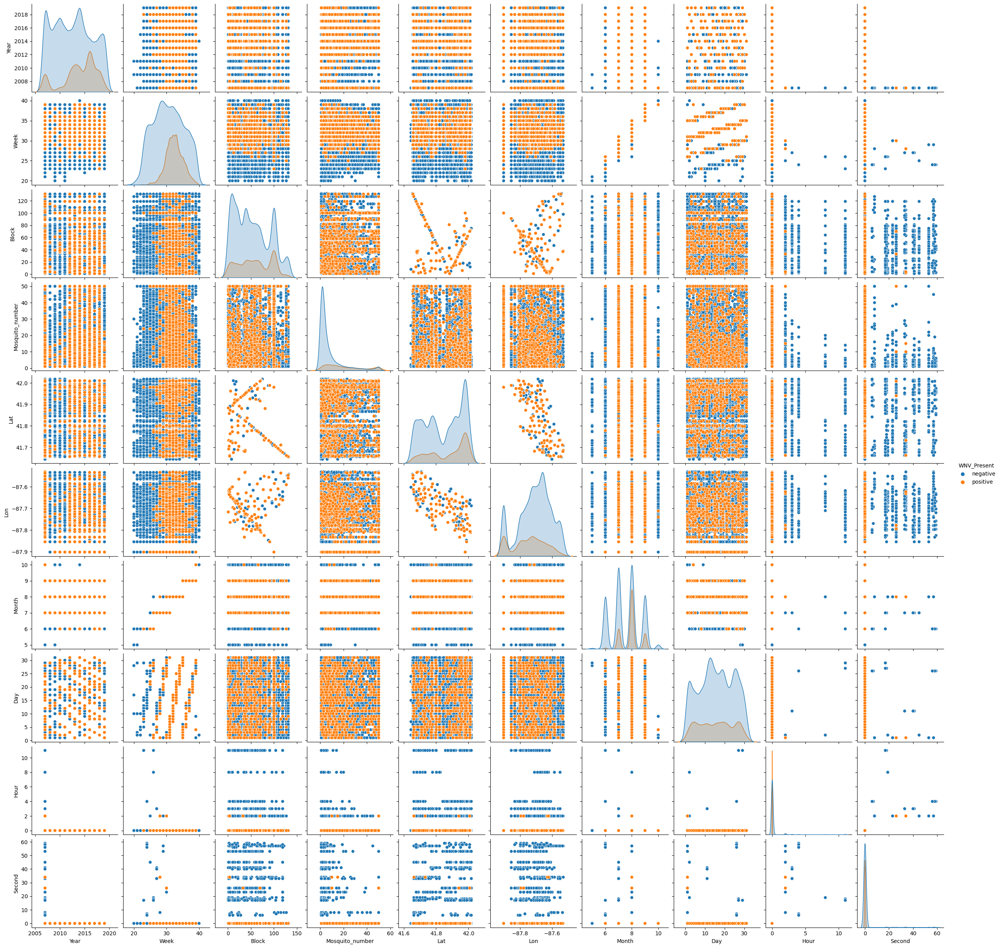

In [182]:
sns.pairplot(dfnew, hue="WNV_Present")

Below we see that the months of August and September have the highest proportion of WNV.

In [183]:
import calendar
dfnew['Month'] = dfnew['Date'].dt.month

# Convert 'WNV_Present' column to numeric
dfnew['WNV_Present'] = np.where(dfnew['WNV_Present'] == 'positive', 1, 0)

# Calculate the total number of samples and positive cases for each month
monthly_totals = dfnew.groupby('Month')['WNV_Present'].count()
monthly_positives = dfnew.groupby('Month')['WNV_Present'].sum()

# Calculate the percentage of positive cases for each month
monthly_percentages = (monthly_positives / monthly_totals) * 100

# Reset index and create a DataFrame
df_monthly = pd.DataFrame({'Month': monthly_percentages.index, 'Percentage': monthly_percentages.values})

# Sort by percentage in descending order
df_monthly = df_monthly.sort_values(by='Percentage', ascending=False)

df_monthly['Month'] = df_monthly['Month'].apply(lambda x: calendar.month_name[x])

# Create a donut chart using Plotly Express
fig = px.pie(df_monthly, values='Percentage', names='Month',
             title='Proportion of Positive WNV Cases by Month',
             hole=0.5)

# Customize the layout
fig.update_traces(textposition='inside', textinfo='percent+label')

# Show the plot
fig.show()

# Summary


In this deliverable, we analyzed mosquito tracking data from the city of Chicago to understand mosquito populations and West Nile Virus (WNV) prevalence. We performed data cleaning and exploratory data analysis, uncovering insights such as seasonal variations in mosquito abundance and the relationship between mosquito species and WNV. These findings can inform public health strategies for mosquito control and disease prevention.

## EXTRA: Appendix
External Attempts at Filling in the Missing Values
By 

In [184]:
from geopy.geocoders import Nominatim

In [185]:
geopy.__version__

'2.3.0'

In [186]:
geolocator = Nominatim(user_agent="my_geocoder")

In [187]:
geolocator = Nominatim(user_agent="my_geocoder")

for index, row in df.iterrows():
    if pd.isnull(row['Lat']) or pd.isnull(row['Lon']):
        address = row['Address_Block']

        if pd.notnull(address):
            try:
                location = geolocator.geocode(Address_Block, timeout=None)  # Increase the timeout value if needed
                if location:
                    df.at[index, 'Lat'] = location.latitude
                    df.at[index, 'Lon'] = location.longitude
            except Exception as e:
                print(f"Geocoding error for address: {address}. Error: {str(e)}")

Geocoding error for address: 100XX W OHARE AIRPORT. Error: name 'Address_Block' is not defined
Geocoding error for address: 100XX W OHARE AIRPORT. Error: name 'Address_Block' is not defined
Geocoding error for address: 100XX W OHARE AIRPORT. Error: name 'Address_Block' is not defined
Geocoding error for address: 100XX W OHARE AIRPORT. Error: name 'Address_Block' is not defined
Geocoding error for address: 100XX W OHARE AIRPORT. Error: name 'Address_Block' is not defined
Geocoding error for address: 4XX W 127TH. Error: name 'Address_Block' is not defined
Geocoding error for address: 100XX W OHARE AIRPORT. Error: name 'Address_Block' is not defined
Geocoding error for address: 100XX W OHARE AIRPORT. Error: name 'Address_Block' is not defined
Geocoding error for address: 4XX W 127TH. Error: name 'Address_Block' is not defined
Geocoding error for address: 100XX W OHARE AIRPORT. Error: name 'Address_Block' is not defined
Geocoding error for address: 100XX W OHARE AIRPORT. Error: name 'Addre

geolocator = Nominatim(user_agent="my_geocoder")

for index, row in df.iterrows():
    if pd.isnull(row['Lat']) or pd.isnull(row['Lon']):
        address = row['Address_Block']

        if pd.notnull(address):
            try:
                location = geolocator.geocode(Address_Block, timeout=None)  # Increase the timeout value if needed
                if location:
                    df.at[index, 'Lat'] = location.latitude
                    df.at[index, 'Lon'] = location.longitude
            except Exception as e:
                print(f"Geocoding error for address: {address}. Error: {str(e)}")

Below is an ill-fated attempt to use K-Nearest Neighbors to impute the mising values of, it does work but I found that it was not the appropriate method for this. As 

In [188]:
from sklearn.impute import KNNImputer
import pandas as pd


# Make a copy of the original DataFrame
df_imputed = dfnew.copy()

# Select the columns to impute
impute_columns = ['Lat', 'Lon']

# Create a KNNImputer object
knn_imputer = KNNImputer(n_neighbors=5)  # You can adjust the value of n_neighbors

# Perform KNN imputation on the copied DataFrame
df_imputed[impute_columns] = knn_imputer.fit_transform(df_imputed[impute_columns])

# Display the imputed DataFrame
print(df_imputed)

       Year  Week                       Address_Block  Block   Trap Trap_type  \
0      2019    39               100XX W OHARE AIRPORT    100   T910    GRAVID   
1      2019    39                   52XX S KOLMAR AVE     52   T114    GRAVID   
2      2019    39                  58XX N WESTERN AVE     58   T028    GRAVID   
3      2019    39              39XX N SPRINGFIELD AVE     39   T228    GRAVID   
4      2019    39                 131XX S BRANDON AVE    131   T209    GRAVID   
5      2019    39                    21XX N CANNON DR     21  T054C    GRAVID   
6      2019    39                 11XX W ROOSEVELT RD     11   T048    GRAVID   
7      2019    39                      22XX W 51ST ST     22   T061    GRAVID   
8      2019    39                    22XX N CANNON DR     22  T054A    GRAVID   
9      2019    39                      3XX W 104TH ST      3   T095    GRAVID   
10     2019    39                    25XX W GRAND AVE     25   T046    GRAVID   
11     2019    39           

In [189]:
df['WNV_Present'] = df['WNV_Present'].map({'negative': 0, 'positive': 1})
wnv_prevalence = df.groupby(['Lat', 'Lon'])['WNV_Present'].mean().reset_index()
wnv_prevalence['Prevalence'] = wnv_prevalence['WNV_Present'] * 100

In [190]:
df_chicago = dfnew  # Assuming the DataFrame already contains Chicago locations

# Calculate the proportion of WNV found at each location
location_wnv_proportion = df_chicago.groupby(['Lat', 'Lon'])['WNV_Present'].mean().reset_index()
location_wnv_proportion['Proportion'] = location_wnv_proportion['WNV_Present'] * 100  # Convert to percentage

# Find the locations with the highest proportion of WNV
top_locations = location_wnv_proportion.nlargest(10, 'Proportion')

# Create a scatter plot using Plotly Express
fig = px.scatter_mapbox(top_locations, lat='Lat', lon='Lon', size='Proportion', color='Proportion',
                        hover_name='Proportion', hover_data=['Proportion'], zoom=10, center={'lat': 41.8781, 'lon': -87.6298},
                        title='Locations with Highest WNV Proportion')

# Customize the layout
fig.update_layout(mapbox_style='carto-positron', margin={'r': 0, 't': 30, 'l': 0, 'b': 0})
fig.update_traces(marker=dict(sizemode='diameter', sizeref=0.3), selector=dict(mode='markers'))

# Show the scatter plot
fig.show()





